In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

/hpc/group/pbenfeylab/ch416/miniconda3/envs/genesys/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
## Conda Env genesys on DCC
print(torch.__version__)
print(sc.__version__) 

1.11.0
1.9.6


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
#dataset = Root_Dataset(data['X_test'], data['y_test'])
#loader = DataLoader(dataset,
#                         batch_size = batch_size,
#                         shuffle = True, drop_last=True)

X_all = np.vstack((data['X_train'],data['X_val'],data['X_test']))
y_all = pd.concat((data['y_train'],data['y_val'],data['y_test']))
dataset = Root_Dataset(X_all, y_all)
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [6]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

## Extract a sample

In [7]:
sample = next(iter(loader))
xo = sample['x'].to(device)
y = sample['y'].to(device)
y_label = [num2class[i] for i in y.tolist()]

In [8]:
xo.shape

torch.Size([2000, 11, 17513])

In [9]:
len(y_label)

2000

In [10]:
len(loader)

55

In [11]:
## GRN for the transition t0 to t1
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            #pred_h = model.init_hidden(batch_size)
            #tfrom = model.generate_current(x, pred_h, 0).to('cpu').detach().numpy()
            #cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            cfrom = x[np.where(np.array(y_label)==ct)[0],0,:] 
            
            #pred_h = model.init_hidden(batch_size)
            #tto = model.generate_next(x, pred_h, 0).to('cpu').detach().numpy()   
            #cto = tto[np.where(np.array(y_label)==ct)[0],:]
            cto = x[np.where(np.array(y_label)==ct)[0],1,:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

Atrichoblast


/tmp/ipykernel_810401/529540224.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()


Trichoblast
Cortex
Endodermis
Pericycle
Procambium
Xylem
Phloem
Lateral Root Cap
Columella


In [12]:
# Save the array to disk
np.save('genesys_raw_ctw_t0-t1.npy', ctw)

In [11]:
ctw = np.load('genesys_raw_ctw_t0-t1.npy')

In [12]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    if np.std(ctw[i])==0:
        ctw_z[i] = np.zeros((17513, 17513))
    else:
        ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [13]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [14]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [15]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [16]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

Name
NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: count, dtype: int64

## Network Analysis

In [17]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [19]:
def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

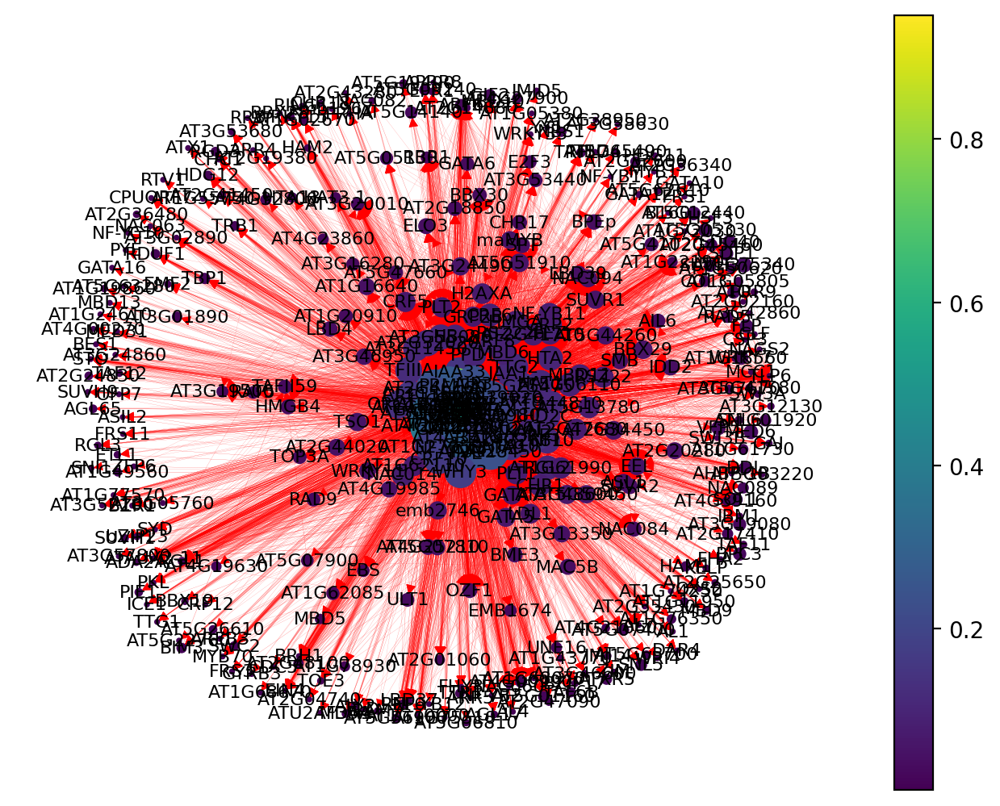

In [20]:
atri = network(0)

In [21]:
atri

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
PLT1,1.072581,0.075269,0.997312,0.308118,0.000408,0.153906
AT4G00238,0.618280,0.379032,0.239247,0.111157,0.000299,0.120422
WER,1.172043,0.951613,0.220430,0.097644,0.000407,0.152317
BRON,0.948925,0.400538,0.548387,0.094014,0.000348,0.139071
HDA3,1.139785,0.844086,0.295699,0.086065,0.000386,0.148555
...,...,...,...,...,...,...
NAC082,0.016129,0.005376,0.010753,0.000000,0.000171,0.008932
AT4G23860,0.037634,0.016129,0.021505,0.000000,0.000187,0.019915
EMF2,0.034946,0.005376,0.029570,0.000000,0.000192,0.017595
AT1G74250,0.005376,0.002688,0.002688,0.000000,0.000123,0.002797


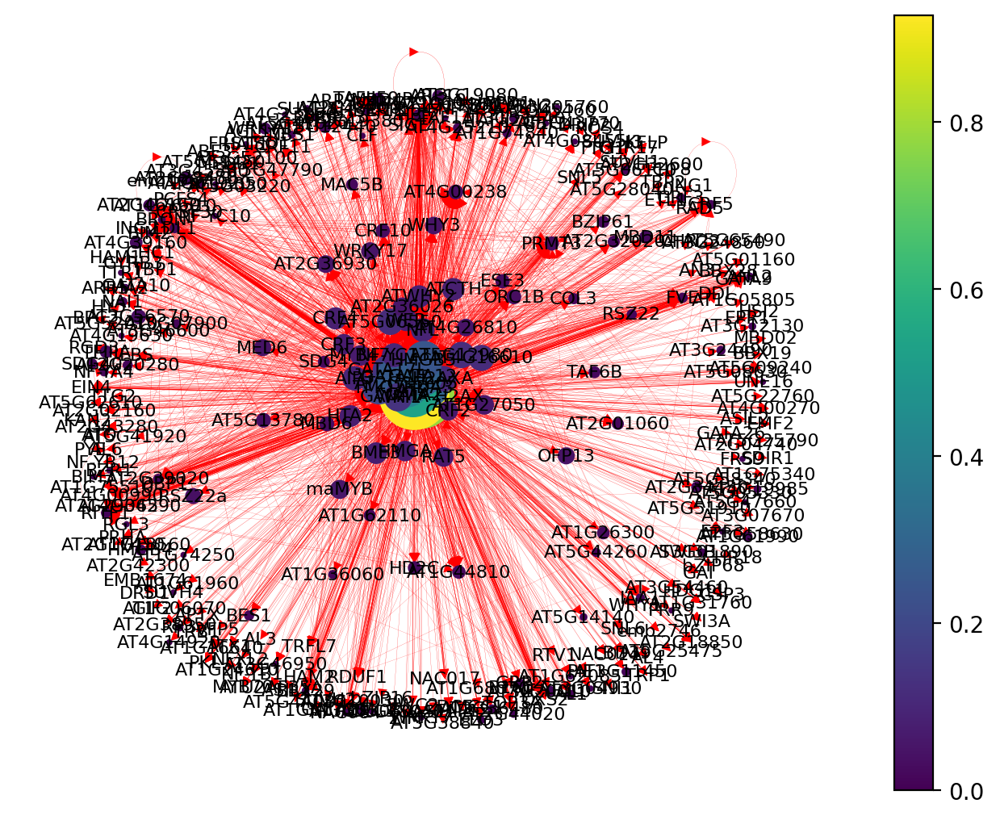

In [22]:
tri = network(1)

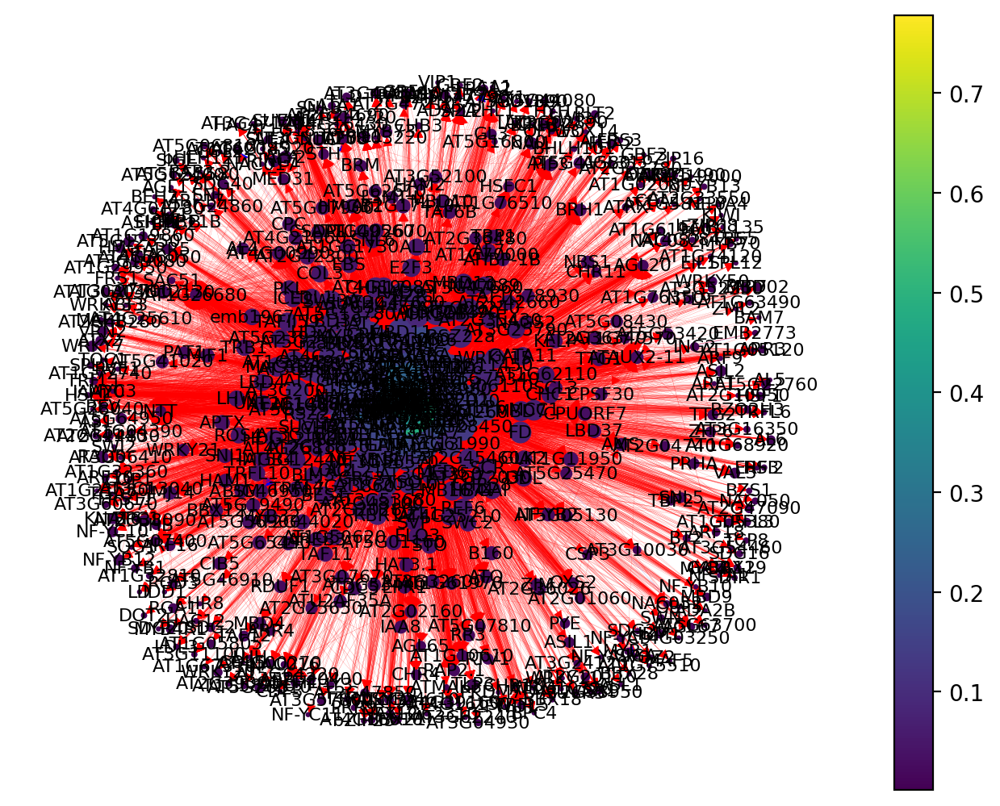

In [23]:
cor = network(2)

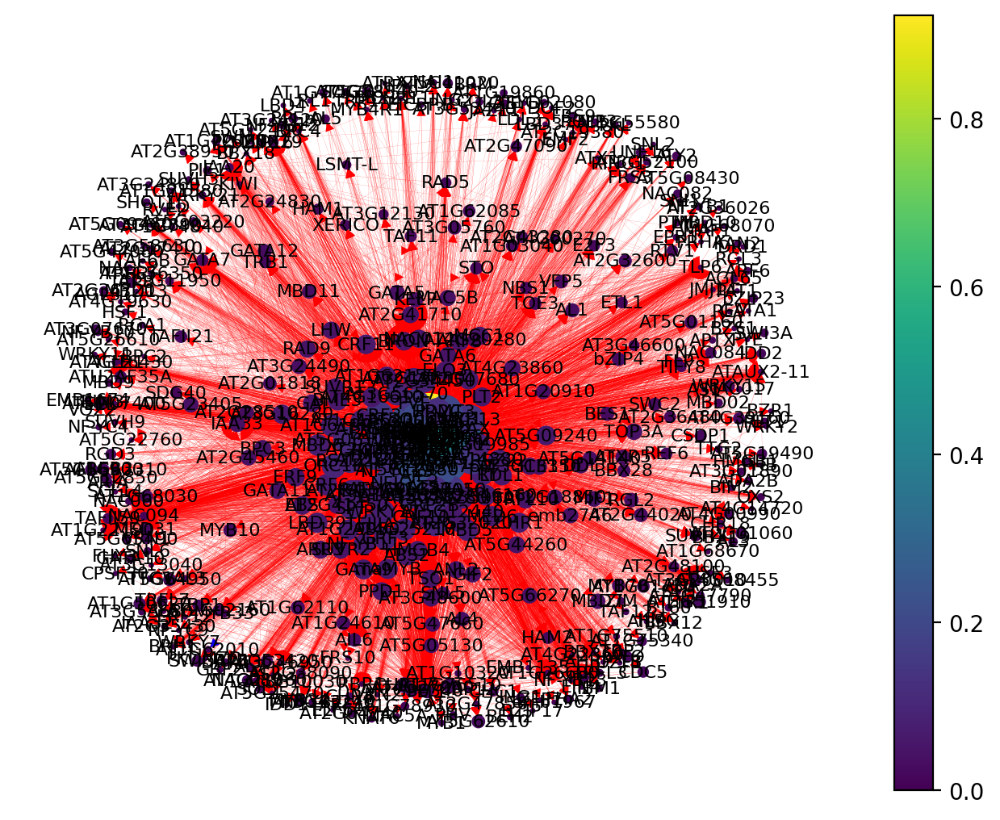

In [24]:
end = network(3)

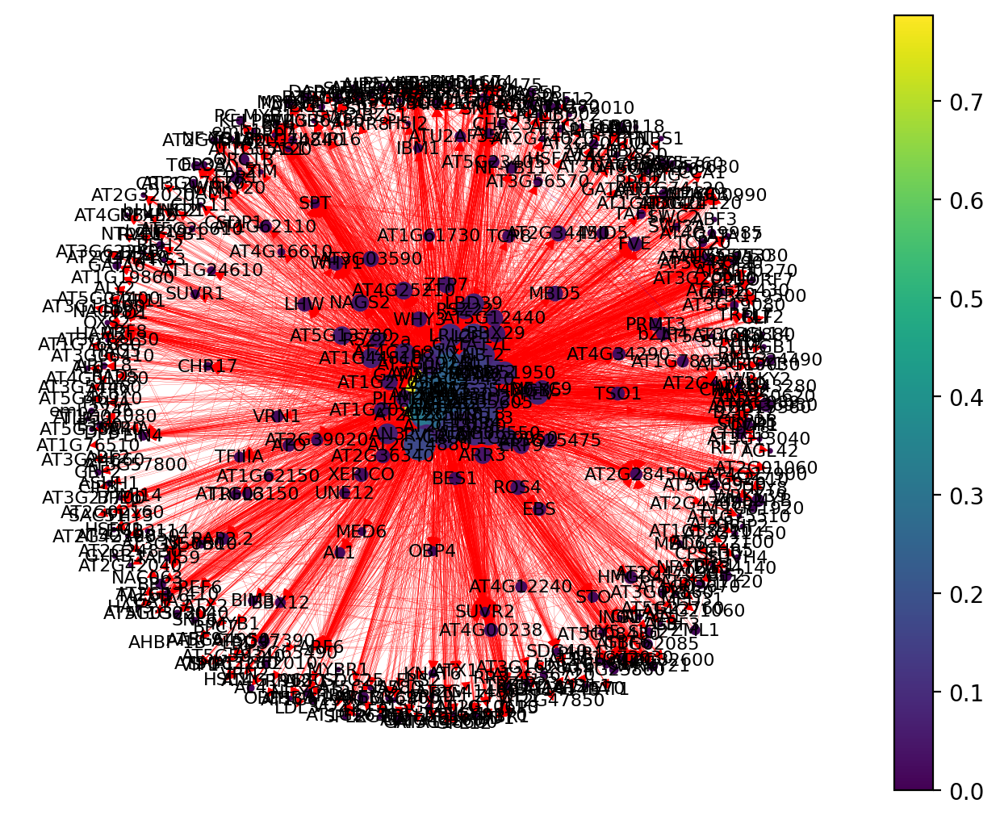

In [25]:
per = network(4)

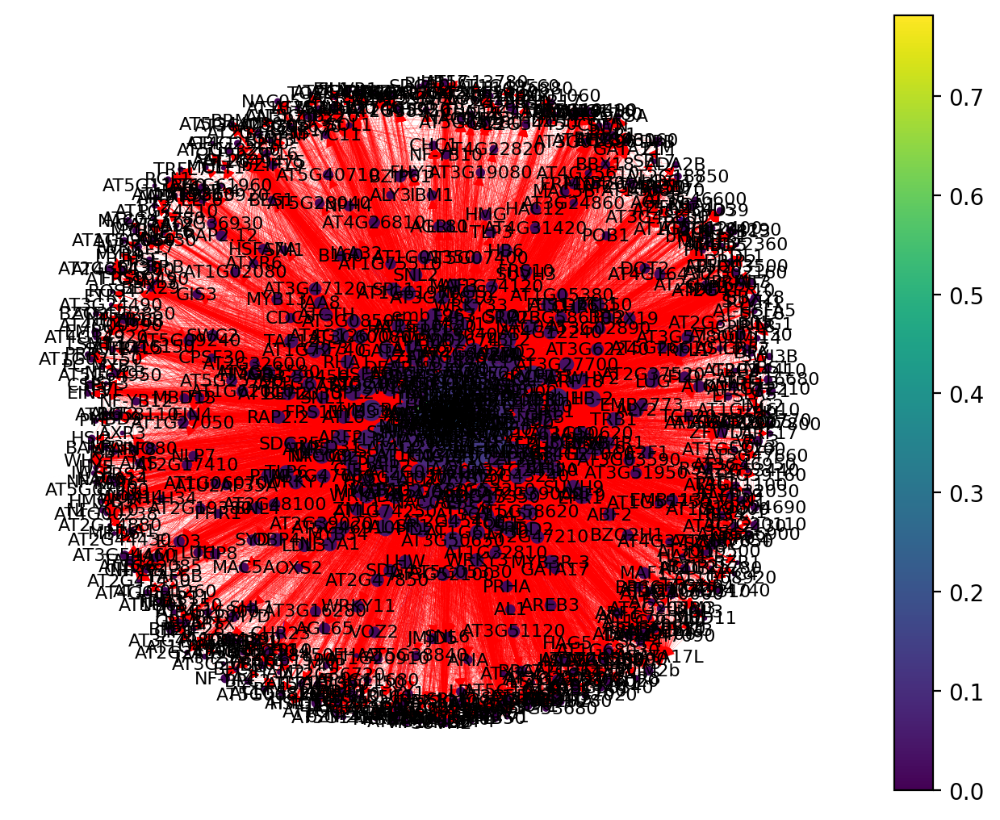

In [26]:
pro = network(5)

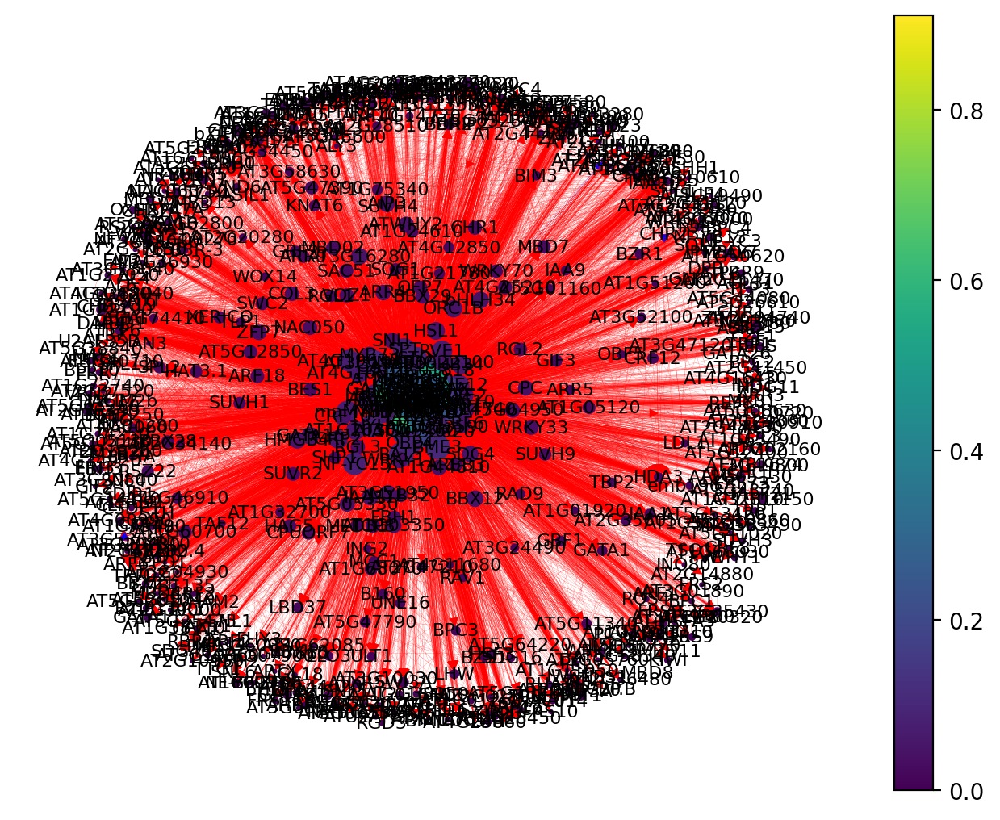

In [27]:
xyl = network(6)

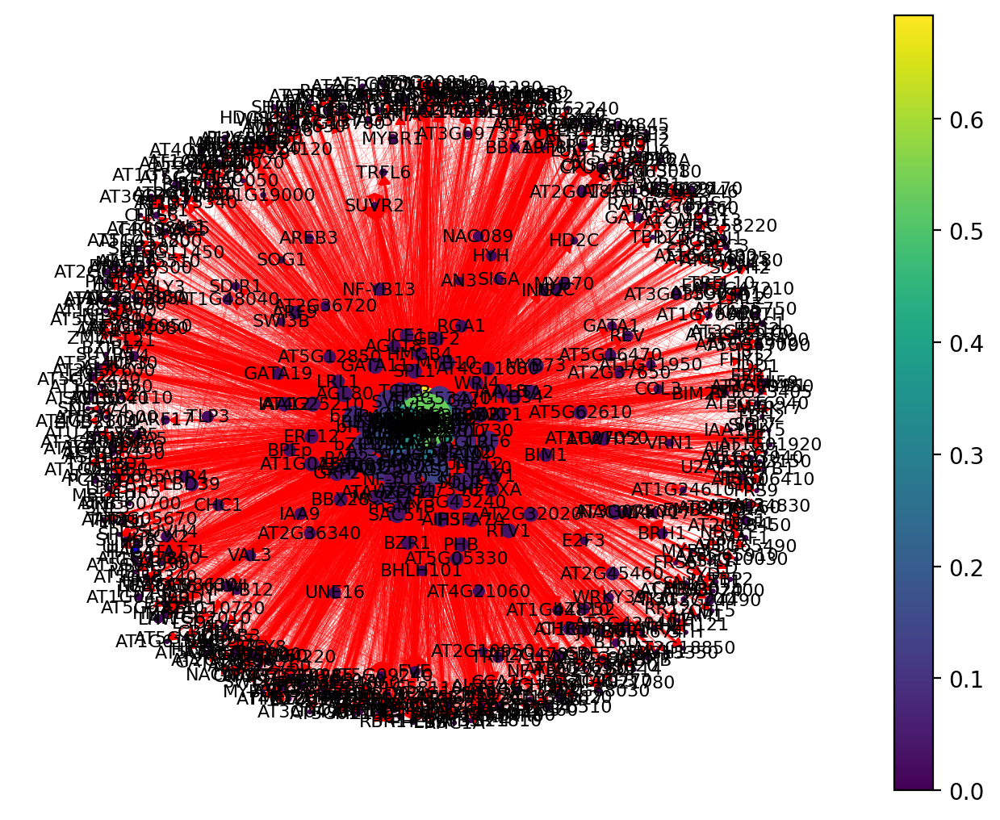

In [28]:
phl = network(7)

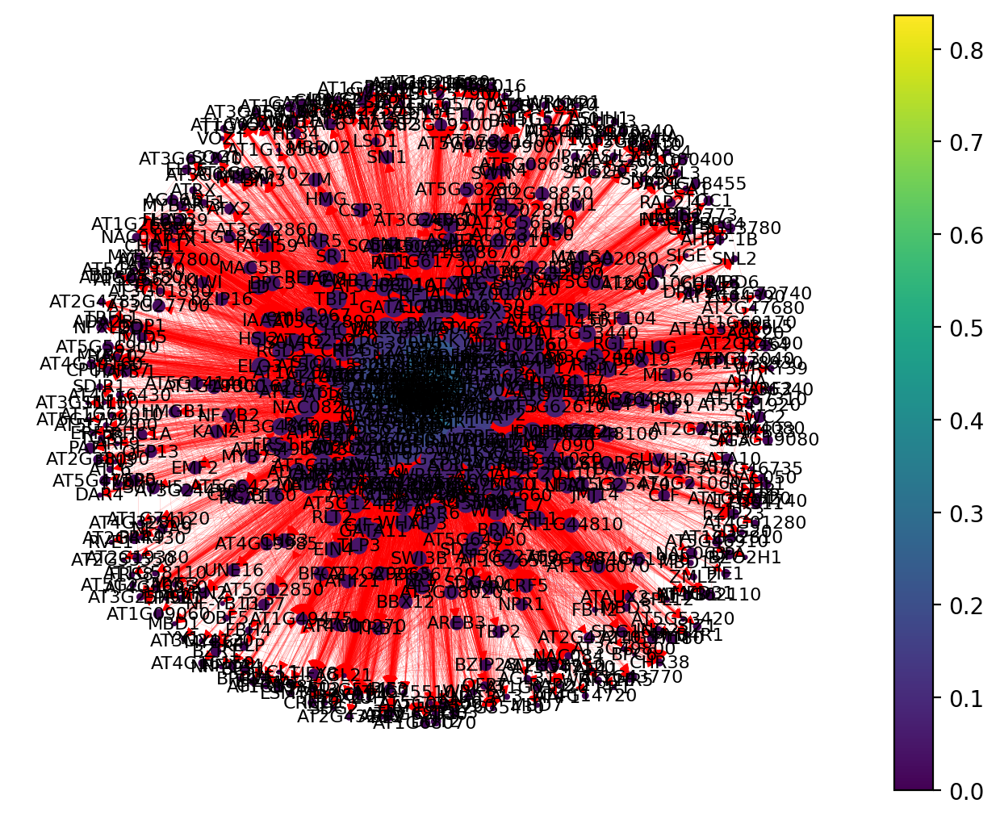

In [29]:
lrc = network(8)

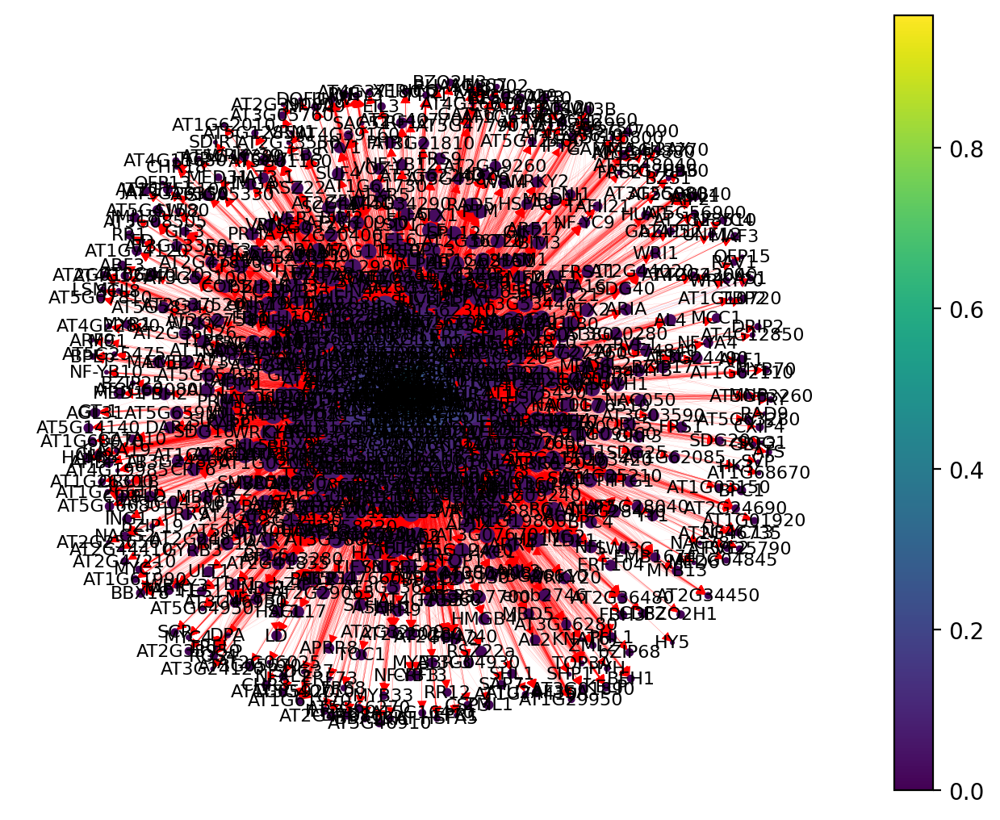

In [30]:
col = network(9)

In [31]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [33]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts())
tf_occurance = tf_occurance.rename(columns={
    'count': 'tf_occurance'
})
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [34]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum


In [35]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum


In [36]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
AT5G59450,0.000101,0.051075,0.002688,3,3.053865
GATA10,0.000014,0.002688,0.029570,3,3.032273
AT3G01890,0.000007,0.013441,0.008065,3,3.021513
AT5G63700,0.000007,0.008065,0.010753,3,3.018824


In [37]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
ESE3,0.00006,0.028302,0.003145,3,3.031506
GBF1,0.00001,0.003145,0.003145,3,3.006299


In [38]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
SCL14,0.000137,0.039370,0.011024,3,3.050530
MBF1B,0.000119,0.011024,0.004724,3,3.015867
ZML2,0.000079,0.004724,0.003150,3,3.007954
AT4G37180,0.000077,0.014173,0.001575,3,3.015825
SUVH5,0.000060,0.023622,0.006299,3,3.029981
AT3G43240,0.000057,0.009449,0.004724,3,3.014230
OFP15,0.000042,0.177953,0.001575,3,3.179570
AT5G57150,0.000030,0.007874,0.001575,3,3.009479
SNL4,0.000025,0.011024,0.001575,3,3.012623
SDG37,0.000025,0.045669,0.004724,3,3.050419


In [39]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
FES1,0.085590,0.011480,0.024235,3,3.121304
LBD15,0.043631,0.385204,0.002551,3,3.431386
NAC063,0.023060,0.033163,0.028061,3,3.084285
AT3G60670,0.000764,0.501276,0.070153,3,3.572193
AT2G19260,0.000083,0.017857,0.002551,3,3.020491
TLP7,0.000037,0.133929,0.014031,3,3.147997
ATRX,0.000008,0.058673,0.008929,3,3.067610
AT1G36060,0.000007,0.082908,0.002551,3,3.085466
AT1G04390,0.000007,0.017857,0.007653,3,3.025517
SIGE,0.000005,0.040816,0.026786,3,3.067607


In [40]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
HMGB6,0.005102,0.000188,0.311774,0.349036,0.004975,0.002141,6,6.673218
AT5G23405,0.000022,0.000096,0.069652,0.036403,0.003317,0.004283,6,6.113772
LSMT-L,0.000033,0.000009,0.021559,0.010707,0.054726,0.012848,6,6.099882


In [41]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
FRS12,0.006854,0.009950,0.009950,3,3.026754
HSFB4,0.004162,0.334992,0.001658,3,3.340813
pde191,0.000515,0.162521,0.003317,3,3.166353
AT2G42660,0.000430,0.034826,0.102819,3,3.138075
SCL3,0.000284,0.026534,0.003317,3,3.030134
NF-YB12,0.000143,0.016584,0.004975,3,3.021702
SVP,0.000072,0.039801,0.003317,3,3.043189
GL3,0.000039,0.013267,0.013267,3,3.026573
AT4G01280,0.000033,0.003317,0.009950,3,3.013300
LOL2,0.000019,0.058043,0.003317,3,3.061379


In [42]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
AT1G62010,0.000542,0.004283,0.004283,3,3.009108
JKD,0.000184,0.083512,0.002141,3,3.085837
AT4G22360,0.000124,0.002141,0.004283,3,3.006548
GRF4,0.000060,0.265525,0.002141,3,3.267726
AT1G62150,0.000032,0.053533,0.002141,3,3.055707
AT3G05760,0.000009,0.025696,0.002141,3,3.027846
HSF1,0.000009,0.004283,0.002141,3,3.006433


In [43]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
PLIM2b,0.000331,0.000002,0.000431,0.000271,0.042553,0.010,0.1875,0.249595,0.006383,0.00375,0.009868,0.011345,12,12.522029
AT5G09460,0.000005,0.000047,0.000431,0.000416,0.008511,0.035,0.1250,0.084279,0.004255,0.01750,0.018092,0.008104,12,12.301639


In [44]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
U2AF35B,0.000009,0.006383,0.004255,3,3.010647
AT3G19360,0.000005,0.004255,0.002128,3,3.006388


In [45]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
AT1G43770,0.021530,0.08375,0.01125,3,3.116530
IAA32,0.019025,0.01500,0.08875,3,3.122775
AT3G21810,0.003324,0.02750,0.00500,3,3.035824
AGL42,0.003204,0.00500,0.01750,3,3.025704
MYB88,0.001494,0.44375,0.00250,3,3.447744
AT2G24680,0.000341,0.06875,0.00125,3,3.070341
HAC4,0.000217,0.00250,0.01375,3,3.016467
RAV1,0.000127,0.30875,0.00125,3,3.310127
CHR24,0.000119,0.07625,0.00125,3,3.077619
MYBR1,0.000077,0.17250,0.00125,3,3.173827


In [46]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
LBD31,0.006023,0.082237,0.001645,3,3.089905
TCP20,0.000713,0.251645,0.004934,3,3.257292
AT3G03590,0.000290,0.090461,0.003289,3,3.094040
VND6,0.000068,0.006579,0.018092,3,3.024739
DOF1,0.000051,0.264803,0.001645,3,3.266499
AT5G63260,0.000024,0.004934,0.014803,3,3.019761
LBD23,0.000022,0.008224,0.003289,3,3.011535
AT5G47390,0.000019,0.024671,0.008224,3,3.032914
HAG5,0.000011,0.024671,0.003289,3,3.027971
AT4G12850,0.000005,0.014803,0.008224,3,3.023032


In [47]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
bZIP19,0.000258,0.085900,0.012966,3,3.099123
AGL80,0.000158,0.038898,0.021070,3,3.060125
ARF17,0.000076,0.009724,0.024311,3,3.034112
AT3G51950,0.000074,0.092382,0.003241,3,3.095698
AT5G16470,0.000013,0.019449,0.003241,3,3.022704
NF-YC3,0.000005,0.058347,0.006483,3,3.064835
AT5G65130,0.000003,0.001621,0.006483,3,3.008106
bZIP68,0.000003,0.001621,0.011345,3,3.012969
AT3G16940,0.000003,0.004862,0.003241,3,3.008106
GT-1,0.000003,0.004862,0.003241,3,3.008106


In [48]:
tf_spec.to_csv('scRNAseq_TF_GRN_centrality_t0-t1_zscore3.csv', index=True)

In [49]:
tf_spec

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,tri_in_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
BBX29,10.0,0.247312,0.053763,0.193548,0.002442,0.000278,0.076342,0.110063,0.006289,0.103774,...,0.089141,0.036019,0.000107,0.120473,0.420918,0.140306,0.280612,0.000464,0.000211,0.068903
ATWHY2,10.0,0.325269,0.290323,0.034946,0.000877,0.000313,0.087843,0.103774,0.081761,0.022013,...,0.030794,0.000276,0.000081,0.040414,0.127551,0.075255,0.052296,0.003810,0.000172,0.034190
HAT1,10.0,0.279570,0.112903,0.166667,0.009238,0.000282,0.079547,0.078616,0.003145,0.075472,...,0.129660,0.018804,0.000109,0.138462,0.355867,0.116071,0.239796,0.000269,0.000210,0.065037
HMGB5,10.0,0.720430,0.521505,0.198925,0.065806,0.000297,0.130504,0.345912,0.248428,0.097484,...,0.116694,0.000329,0.000105,0.067510,0.431122,0.156888,0.274235,0.000350,0.000214,0.072473
AT4G25210,10.0,0.134409,0.037634,0.096774,0.000196,0.000261,0.051972,0.044025,0.009434,0.034591,...,0.048622,0.000318,0.000087,0.053194,0.144133,0.025510,0.118622,0.000007,0.000185,0.038891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AT3G07500,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000056,0.005611,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AT2G04845,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000064,0.004459,0.005102,0.003827,0.001276,0.000000,0.000074,0.001810
RAP2.7,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000090,0.035443,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
DAR7,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.030612,0.028061,0.002551,0.000000,0.000102,0.012089
